# Importing dataset

In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
sb.set()
from sklearn import metrics
import missingno as msn
%matplotlib inline
import matplotlib.pyplot as plt
reg_data = pd.read_excel('WHR2018Chapter2OnlineData.xls',sheet_name = 'SupportingFactors')
data = pd.read_excel('WHR2018Chapter2OnlineData.xls',sheet_name = 'Table2.1')
region = pd.DataFrame(reg_data[["country","Region indicator"]])  # extracting region information from supporting factors sheet

data_M = data.merge(region, on='country', how='left')         # inserting a column of region corresponding to countries to the dataset
col = list(data_M)
col.insert(1,col.pop(col.index('Region indicator')))
data_M = data_M.loc[:,col]
data_M['Region indicator'].fillna("None", inplace=True)
data_M.head(100)    # merged data


,country,Region indicator,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,South Asia,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,South Asia,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,South Asia,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,South Asia,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,South Asia,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540
5,Afghanistan,South Asia,2013,3.572100,7.503376,0.483552,51.042980,0.577955,0.074735,0.823204,0.620585,0.273328,0.482847,-1.879709,-1.403036,1.223690,0.342569,NaN,NaN,0.304368
6,Afghanistan,South Asia,2014,3.130896,7.484583,0.525568,51.370525,0.508514,0.118579,0.871242,0.531691,0.374861,0.409048,-1.773257,-1.312503,1.395396,0.445686,NaN,NaN,0.413974
7,Afghanistan,South Asia,2015,3.982855,7.466215,0.528597,51.693527,0.388928,0.094686,0.880638,0.553553,0.339276,0.260557,-1.844364,-1.291594,2.160618,0.542480,NaN,NaN,0.596918
8,Afghanistan,South Asia,2016,4.220169,7.461401,0.559072,52.016529,0.522566,0.057072,0.793246,0.564953,0.348332,0.324990,-1.917693,-1.432548,1.796219,0.425627,NaN,NaN,0.418629
9,Afghanistan,South Asia,2017,2.661718,7.460144,0.490880,52.339527,0.427011,-0.106340,0.954393,0.496349,0.371326,0.261179,NaN,NaN,1.454051,0.546283,NaN,NaN,0.286599


# Visualisation of missing data

In [2]:
data_M.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1562 entries, 0 to 1561
Data columns (total 20 columns):
country                                                     1562 non-null object
Region indicator                                            1562 non-null object
year                                                        1562 non-null int64
Life Ladder                                                 1562 non-null float64
Log GDP per capita                                          1535 non-null float64
Social support                                              1549 non-null float64
Healthy life expectancy at birth                            1553 non-null float64
Freedom to make life choices                                1533 non-null float64
Generosity                                                  1482 non-null float64
Perceptions of corruption                                   1472 non-null float64
Positive affect                                             1544 non-null flo

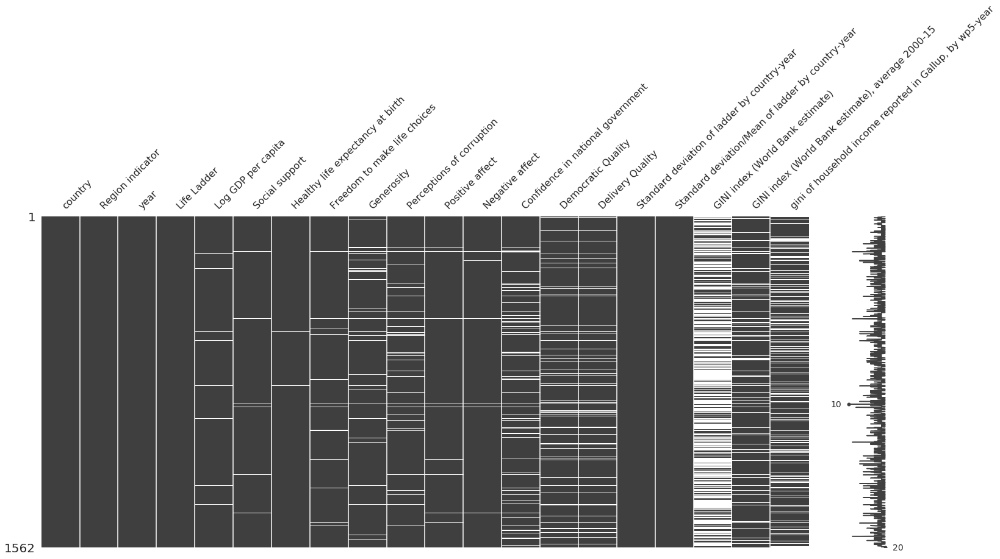

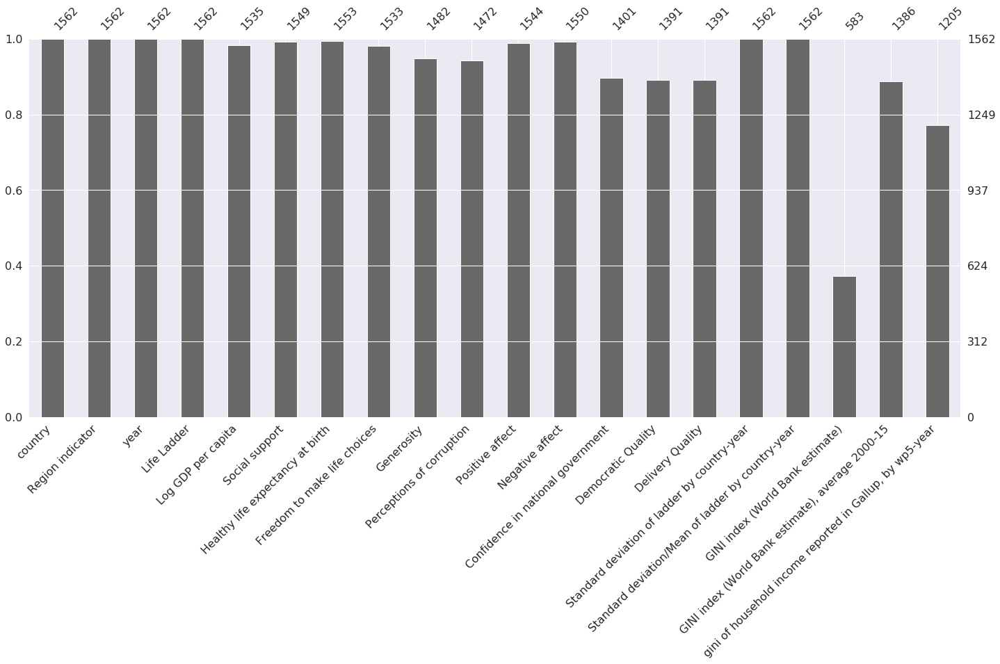

In [4]:
msn.matrix(data_M.sample(1562))   # visualise the locations where the values are missing

msn.bar(data_M.sample(1562))    # counting the data points present for each variable in the dataset

# Filling in the missing data

<font color='red'>**_We are filling in the missing data for creating regression models, otherwise we would not have enough data points to be used as training data_**</font>

In [3]:
import scipy as sp

In [4]:
data_pred = data_M.interpolate(method = 'linear')    # use scipy.interpolation to fill in the missing data values
data_pred.head(1562)

,country,Region indicator,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,South Asia,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,South Asia,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,South Asia,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,South Asia,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,South Asia,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540
5,Afghanistan,South Asia,2013,3.572100,7.503376,0.483552,51.042980,0.577955,0.074735,0.823204,0.620585,0.273328,0.482847,-1.879709,-1.403036,1.223690,0.342569,NaN,NaN,0.304368
6,Afghanistan,South Asia,2014,3.130896,7.484583,0.525568,51.370525,0.508514,0.118579,0.871242,0.531691,0.374861,0.409048,-1.773257,-1.312503,1.395396,0.445686,NaN,NaN,0.413974
7,Afghanistan,South Asia,2015,3.982855,7.466215,0.528597,51.693527,0.388928,0.094686,0.880638,0.553553,0.339276,0.260557,-1.844364,-1.291594,2.160618,0.542480,NaN,NaN,0.596918
8,Afghanistan,South Asia,2016,4.220169,7.461401,0.559072,52.016529,0.522566,0.057072,0.793246,0.564953,0.348332,0.324990,-1.917693,-1.432548,1.796219,0.425627,NaN,NaN,0.418629
9,Afghanistan,South Asia,2017,2.661718,7.460144,0.490880,52.339527,0.427011,-0.106340,0.954393,0.496349,0.371326,0.261179,-0.981401,-0.926286,1.454051,0.546283,NaN,NaN,0.286599


In [5]:
data_pred.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1562 entries, 0 to 1561
Data columns (total 20 columns):
country                                                     1562 non-null object
Region indicator                                            1562 non-null object
year                                                        1562 non-null int64
Life Ladder                                                 1562 non-null float64
Log GDP per capita                                          1562 non-null float64
Social support                                              1562 non-null float64
Healthy life expectancy at birth                            1562 non-null float64
Freedom to make life choices                                1562 non-null float64
Generosity                                                  1562 non-null float64
Perceptions of corruption                                   1562 non-null float64
Positive affect                                             1562 non-null flo

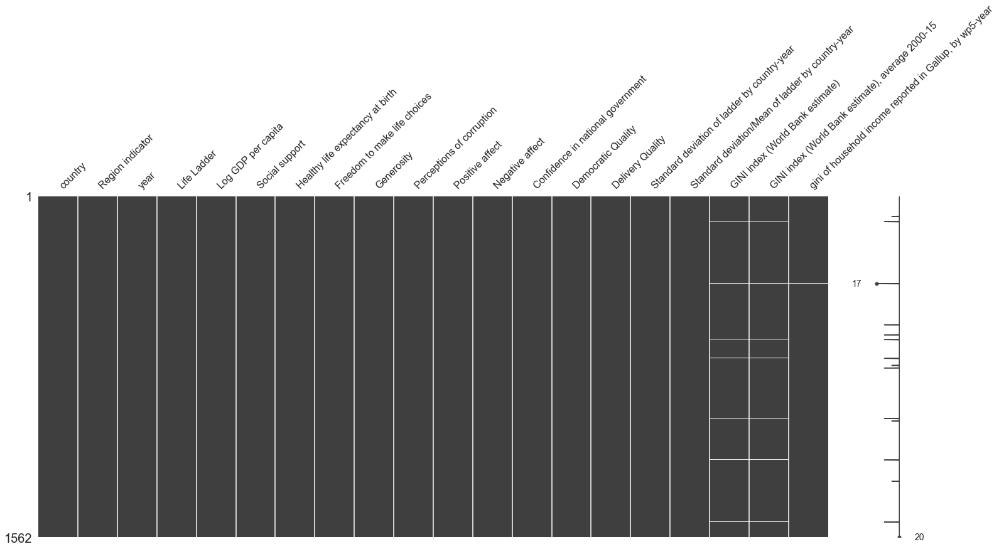

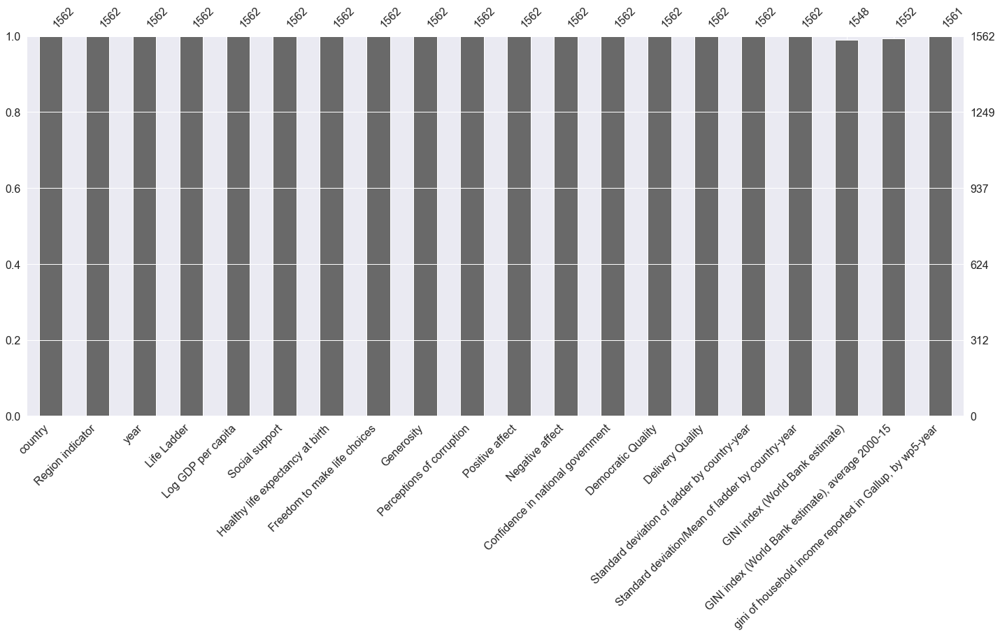

In [6]:
msn.matrix(data_pred.sample(1562))    # some data points are still missing beacause extrapolation was not done and those points lie outside the range of given data

msn.bar(data_pred.sample(1562))

# Visualisation of filled-in data

/home/cuong/anaconda3/lib/python3.7/site-packages/matplotlib/tight_layout.py:199: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/home/cuong/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/cuong/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


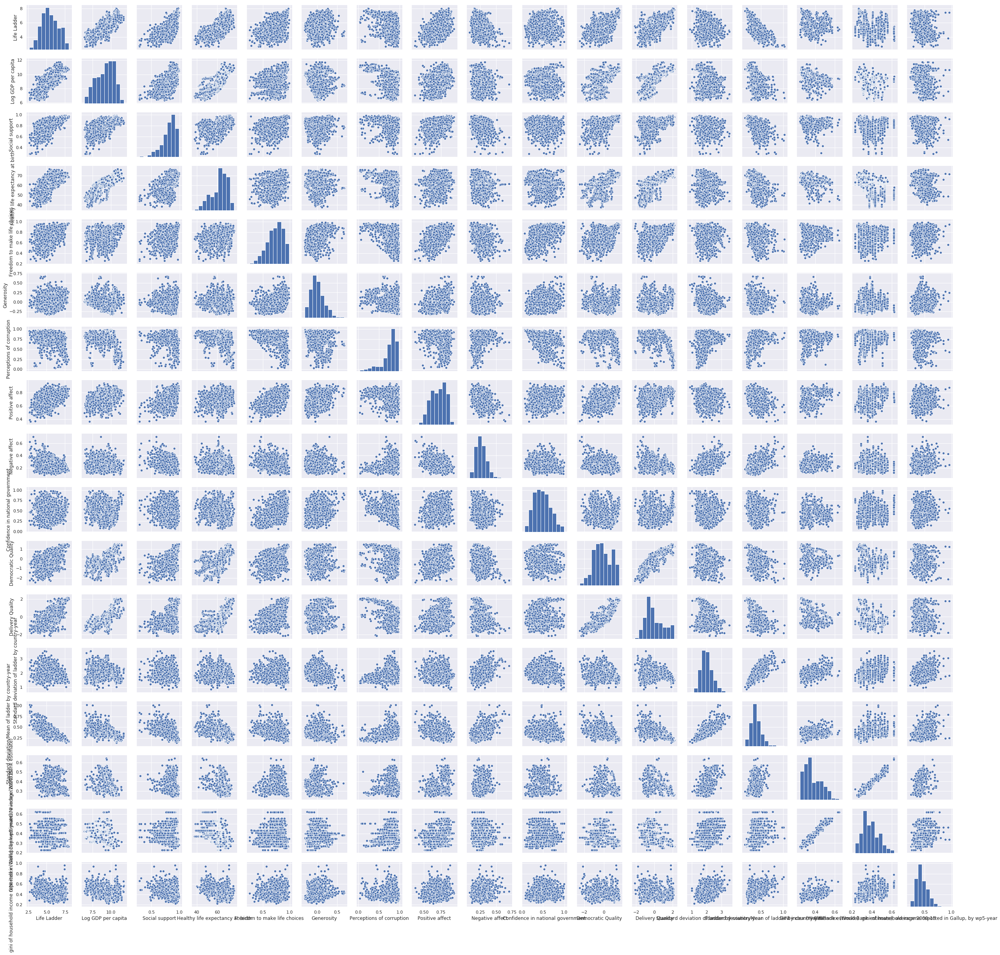

In [34]:

sb.pairplot(data = data_M.drop(['year'],axis=1))    #distribution of original data

/home/cuong/anaconda3/lib/python3.7/site-packages/matplotlib/tight_layout.py:199: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


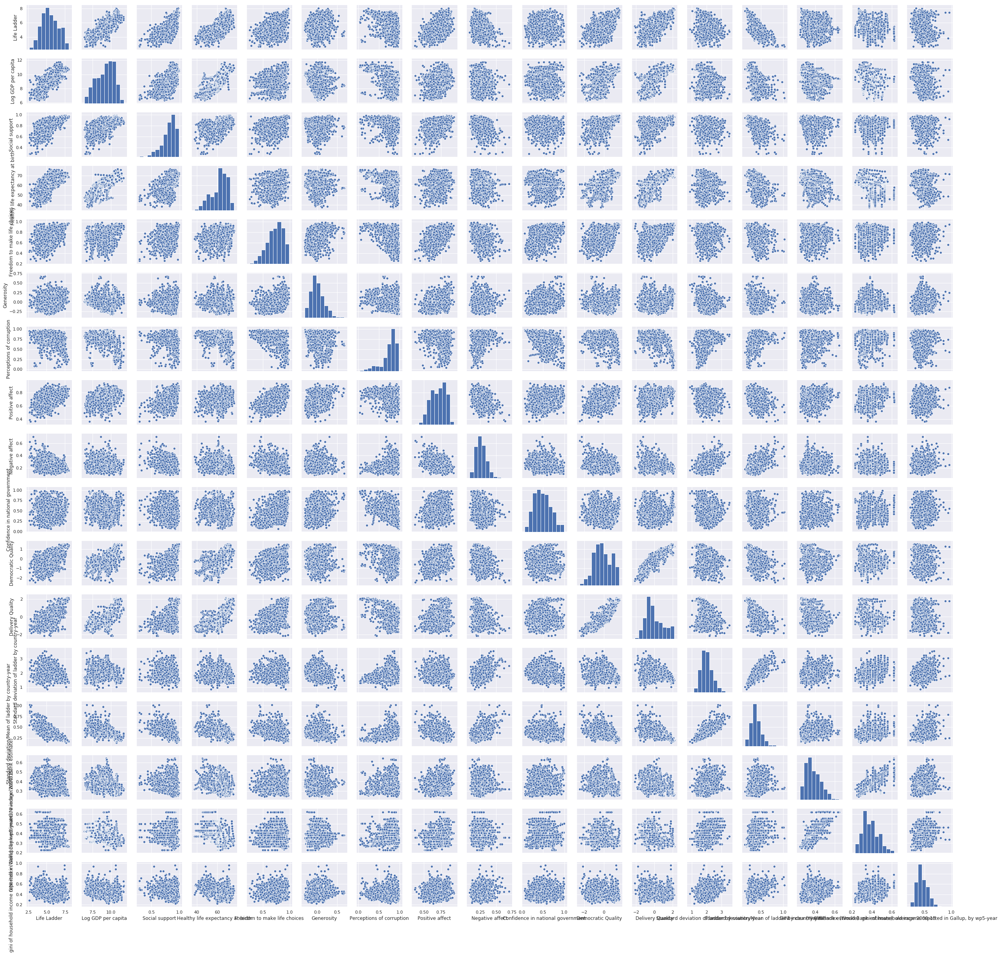

In [50]:
sb.pairplot(data = data_pred.drop(['year'],axis=1))    #distribution of filled in data, which should resemble that of the original data

In [7]:

data_complete = data_pred.dropna()    # we did not use extrapolation to find the missing data points outside the range of given data points because 1.their numbers are not great and 2.their values would be more unreliable as they will be predicted from predicted values.
data_complete.head(1562)

,country,Region indicator,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
14,Albania,Central and Eastern Europe,2012,5.510124,9.246649,0.784502,68.028885,0.601512,-0.174559,0.847675,0.606636,0.271393,0.364894,-0.060784,-0.328862,1.921203,0.348668,0.290000,0.303250,0.568153
15,Albania,Central and Eastern Europe,2013,4.550648,9.258439,0.759477,68.291374,0.631830,-0.132977,0.862905,0.633609,0.338379,0.338095,0.070411,-0.330956,2.315580,0.508846,0.288000,0.303250,0.633796
16,Albania,Central and Eastern Europe,2014,4.813763,9.278097,0.625587,68.512100,0.734648,-0.030553,0.882704,0.684911,0.334543,0.498786,0.314873,-0.187407,2.660069,0.552597,0.286000,0.303250,0.417219
17,Albania,Central and Eastern Europe,2015,4.606651,9.303031,0.639356,68.691956,0.703851,-0.086883,0.884793,0.688370,0.350427,0.506978,0.251629,-0.152544,2.729001,0.592405,0.284000,0.303250,0.422627
18,Albania,Central and Eastern Europe,2016,4.511101,9.337774,0.638411,68.871811,0.729819,-0.023276,0.901071,0.675244,0.321706,0.400910,0.208456,-0.139161,2.646668,0.586701,0.282000,0.303250,0.416540
19,Albania,Central and Eastern Europe,2017,4.639548,9.373718,0.637698,69.051659,0.749611,-0.035140,0.876135,0.669241,0.333884,0.457738,-0.466199,-0.439627,2.682105,0.578096,0.280000,0.303250,0.410488
20,Algeria,Middle East and North Africa,2010,5.463567,9.462701,0.723966,64.298981,0.592696,-0.232023,0.618038,0.609722,0.294390,0.425545,-1.140853,-0.740093,1.626279,0.297659,0.278000,0.276000,0.492713
21,Algeria,Middle East and North Africa,2011,5.317194,9.471962,0.810234,64.529564,0.529561,-0.207379,0.637982,0.550203,0.254897,0.393352,-1.182341,-0.776610,1.660421,0.312274,0.276000,0.276000,0.426202
22,Algeria,Middle East and North Africa,2012,5.604596,9.485086,0.839397,64.739365,0.586663,-0.198871,0.690116,0.604023,0.229716,0.361159,-1.115535,-0.771172,1.939237,0.346008,0.299000,0.276000,0.421409
23,Algeria,Middle East and North Africa,2014,6.354898,9.509210,0.818189,65.130157,0.536666,-0.197471,0.693336,0.625905,0.176866,0.328966,-1.002867,-0.783428,1.632461,0.256882,0.322000,0.276000,0.475492


In [8]:
data_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1548 entries, 14 to 1561
Data columns (total 20 columns):
country                                                     1548 non-null object
Region indicator                                            1548 non-null object
year                                                        1548 non-null int64
Life Ladder                                                 1548 non-null float64
Log GDP per capita                                          1548 non-null float64
Social support                                              1548 non-null float64
Healthy life expectancy at birth                            1548 non-null float64
Freedom to make life choices                                1548 non-null float64
Generosity                                                  1548 non-null float64
Perceptions of corruption                                   1548 non-null float64
Positive affect                                             1548 non-null fl

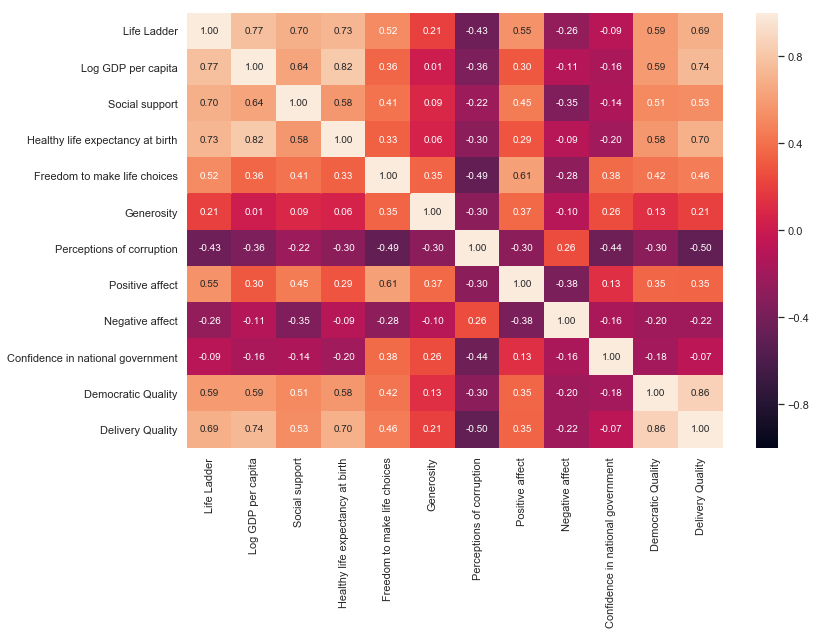

In [9]:
data_c = data_complete.drop(['year','Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year','GINI index (World Bank estimate)','GINI index (World Bank estimate), average 2000-15','gini of household income reported in Gallup, by wp5-year'],axis=1)
f, axes = plt.subplots(1, 1, figsize=(12, 8))
sb.heatmap(data_c.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")    # look at the first column or first row to see which variable has the highest correlation coefficient with Life Ladder

# Building regression models

## <font color='purple'>Preparation of train-test datasets</font>

In [10]:
data_comp = data_complete.drop(['GINI index (World Bank estimate)'],axis = 1)

<font color='red'>**_we are not going to use this column in building our model because the number data points given in the dataset was less than half of the number of the whole dataset and our model would be entirely based on our predicted values when we filled in the missing data points_**</font>

In [11]:
data_comp = data_comp.drop(['Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year'],axis = 1)

<font color='red'>**_we are not going to use these columns because they are directly related/calculated from life ladder, which is the variable that we are trying to predict_**</font>

In [12]:
data_comp1 = data_comp.drop(['year','country','Region indicator'],axis = 1).reset_index()

data_comp = data_comp1.drop(['index'],axis = 1)

<font color='red'>**_we are not going to use these columns because they are string variables/do not have a linear relationship with life ladder_**</font>

In [15]:
data_comp.head()

,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,5.510124,9.246649,0.784502,68.028885,0.601512,-0.174559,0.847675,0.606636,0.271393,0.364894,-0.060784,-0.328862,0.30325,0.568153
1,4.550648,9.258439,0.759477,68.291374,0.631830,-0.132977,0.862905,0.633609,0.338379,0.338095,0.070411,-0.330956,0.30325,0.633796
2,4.813763,9.278097,0.625587,68.512100,0.734648,-0.030553,0.882704,0.684911,0.334543,0.498786,0.314873,-0.187407,0.30325,0.417219
3,4.606651,9.303031,0.639356,68.691956,0.703851,-0.086883,0.884793,0.688370,0.350427,0.506978,0.251629,-0.152544,0.30325,0.422627
4,4.511101,9.337774,0.638411,68.871811,0.729819,-0.023276,0.901071,0.675244,0.321706,0.400910,0.208456,-0.139161,0.30325,0.416540


In [16]:
y = pd.DataFrame(data_comp['Life Ladder'])
X = data_comp.drop(['Life Ladder'],axis = 1)    # drop life ladder becasue it is the variable we are trying to predict

## <font color='purple'>Linear regression model</font>

In [59]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("X_Train Set :", X_train.shape)
print("y_Train Set :", y_train.shape)
print("X_Test Set  :", X_test.shape)
print("y_Test Set  :", y_test.shape)

X_Train Set : (1238, 13)
y_Train Set : (1238, 1)
X_Test Set  : (310, 13)
y_Test Set  : (310, 1)


In [60]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()

In [61]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error

In [62]:
linreg.fit(X_train, y_train)    # train the model with train data
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()
pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"])

Intercept of Regression 	: b =  [-0.60945435]
Coefficients of Regression 	: a =  [[ 0.28501192  1.70648057  0.0199656   0.70677055  0.42982661 -0.9429501
   2.38089338  0.13558517 -0.71716409 -0.01749363  0.05428722  0.09584508
  -0.9561637 ]]



,Predictors,Coefficients
0,Log GDP per capita,0.285012
1,Social support,1.706481
2,Healthy life expectancy at birth,0.019966
3,Freedom to make life choices,0.706771
4,Generosity,0.429827
5,Perceptions of corruption,-0.942950
6,Positive affect,2.380893
7,Negative affect,0.135585
8,Confidence in national government,-0.717164
9,Democratic Quality,-0.017494


### <font color='grey'> Using cross validation to get an estimate of how well the model will do</font>

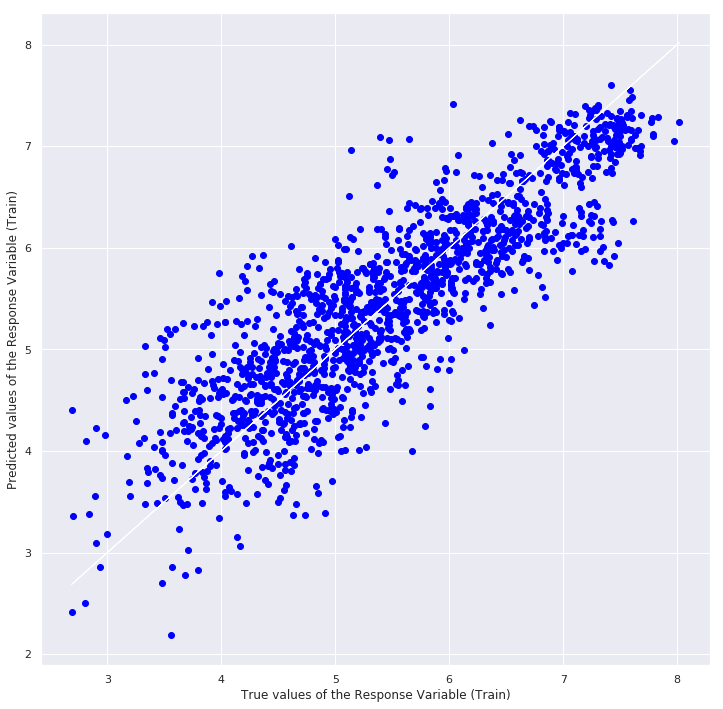

Goodness of Fit of Model 	
Score of model (R^2) 	: [0.78334848 0.73982545 0.70136535 0.68266193 0.78188056]
Error of prediction (MSE) 	: 0.3160911469384231
Accuracy of prediction 	: 0.7465863137699915



In [63]:
y_val_pred_L = cross_val_predict(linreg, X, y, cv=5)    # estimate how well this model will do for predictions

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y, y_val_pred_L, color = "blue")
plt.plot(y, y, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \t")
print("Score of model (R^2) \t:", cross_val_score(linreg, X, y, cv=5))    # R^2 values for each training and validation iteration
print("Error of prediction (MSE) \t:", mean_squared_error(y, y_val_pred_L))
print("Accuracy of prediction \t:", metrics.r2_score(y, y_val_pred_L))    # how well this model should do for predictions
print()

### <font color='grey'> Actual performance of the model</font>

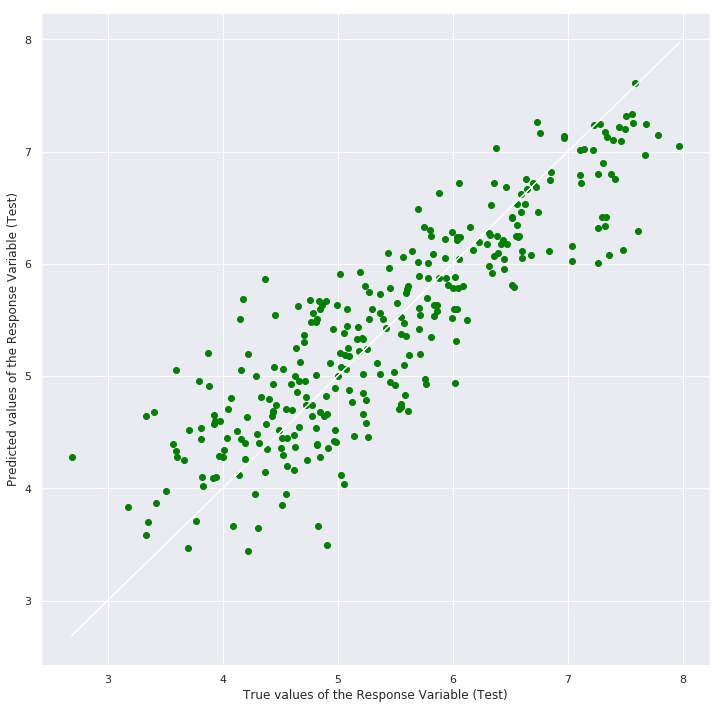

Goodness of Fit of Model 	Test Dataset
Score of model (R^2) 	: 0.7574478379174945
Erroe of prediction (MSE) 	: 0.29769716681881553
Accuracy of prediction 	: 0.7574478379174945



In [64]:
y_test_pred_L = linreg.predict(X_test)

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_test, y_test_pred_L, color = "green")
plt.plot(y_test, y_test, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Test)")
plt.ylabel("Predicted values of the Response Variable (Test)")
plt.show()

print("Goodness of Fit of Model \tTest Dataset")
print("Score of model (R^2) \t:", linreg.score(X_test, y_test))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_test, y_test_pred_L))
print("Accuracy of prediction \t:", metrics.r2_score(y_test, y_test_pred_L))    # how well the model actually did on the test set
print()

## <font color='purple'>Random forest regressor model</font>

In [65]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()

In [66]:
rfr.fit(X_train,y_train.values.ravel())

/home/cuong/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

### <font color='grey'> Using cross validation to get an estimate of how well the model will do</font>

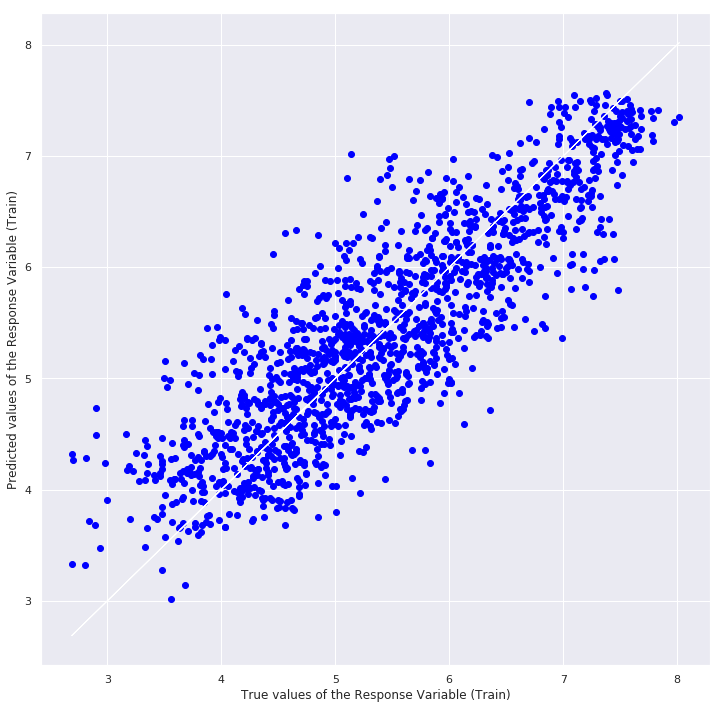

Goodness of Fit of Model 	
Score of model (R^2) 	: [0.77664569 0.70467089 0.7020367  0.7639746  0.79565128]
Error of prediction (MSE) 	: 0.3129503430651141
Accuracy of prediction 	: 0.7491043301553595



In [67]:
y_val_pred_R = cross_val_predict(rfr, X, y.values.ravel(), cv=5)    # estimate how well this model will do for predictions

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y, y_val_pred_R, color = "blue")
plt.plot(y, y, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \t")
print("Score of model (R^2) \t:", cross_val_score(rfr, X, y.values.ravel(), cv=5))    # R^2 values for each training and validation iteration
print("Error of prediction (MSE) \t:", mean_squared_error(y, y_val_pred_R))
print("Accuracy of prediction \t:", metrics.r2_score(y, y_val_pred_R))    # how well this model should do for predictions
print()

### <font color='grey'> Actual performance of the model</font>

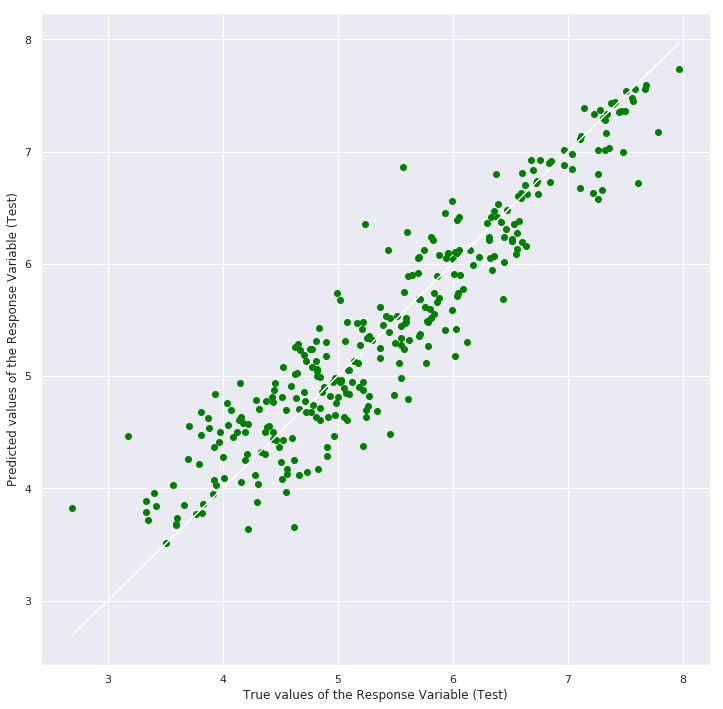

Goodness of Fit of Model 	Test Dataset
Score of model (R^2) 	: 0.8777709788471239
Erroe of prediction (MSE) 	: 0.1500181774832869
Accuracy of prediction 	: 0.8777709788471239



In [68]:
y_test_pred_R = rfr.predict(X_test)

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_test, y_test_pred_R, color = "green")
plt.plot(y_test, y_test, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Test)")
plt.ylabel("Predicted values of the Response Variable (Test)")
plt.show()

print("Goodness of Fit of Model \tTest Dataset")
print("Score of model (R^2) \t:", rfr.score(X_test, y_test))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_test, y_test_pred_R))
print("Accuracy of prediction \t:", metrics.r2_score(y_test, y_test_pred_R))    # how well the model actually did on the test set
print()

## <font color='purple'>Multi-layer perceptron regressior model</font>

### <font color='grey'> Data scaling</font>

In [69]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [70]:
X_tr = pd.DataFrame(scaler.transform(X_train))
X_te = pd.DataFrame(scaler.transform(X_test))

In [71]:
scaler.fit(y_train)
y_tr = pd.DataFrame(scaler.transform(y_train))
y_te = pd.DataFrame(scaler.transform(y_test))

<font color='red'>**_Data scaling is important here to avoid exploding of gradient_**</font>

In [72]:
from sklearn.neural_network import MLPRegressor
mlpr = MLPRegressor(hidden_layer_sizes=(10), activation='tanh', solver='sgd',alpha=0.001,batch_size='auto',
               learning_rate='constant', learning_rate_init=0.01, power_t=0.5, max_iter=1000, shuffle=True,
               random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9,
               nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999,
               epsilon=1e-08)

In [73]:
reg = mlpr.fit(X_tr,y_tr.values.ravel())
#print(reg.coefs_)
#print(reg.intercepts_)

### <font color='grey'> Using cross validation to get an estimate of how well the model will do</font>

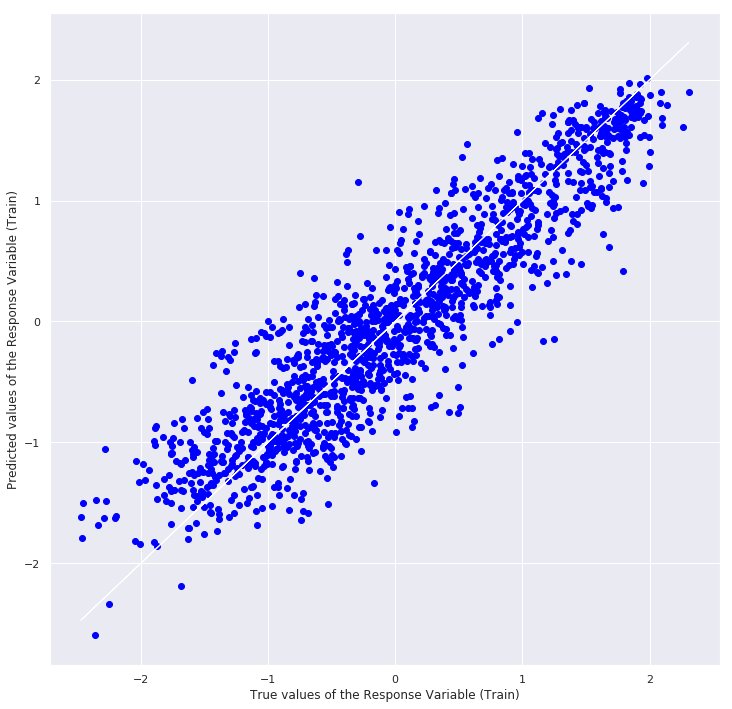

Goodness of Fit of Model 	
Score of model (R^2) 	: [0.81945305 0.69603828 0.6852776  0.71476232 0.75693727]
Error of prediction (MSE) 	: 0.15525450876974228
Accuracy of prediction 	: 0.8447454912302577



In [74]:
scaler.fit(X)
X_sc = pd.DataFrame(scaler.transform(X))
scaler.fit(y)
y_sc = pd.DataFrame(scaler.transform(y))

y_val_pred_M = reg.predict(X_sc)

f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_sc, y_val_pred_M, color = "blue")
plt.plot(y_sc, y_sc, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \t")
print("Score of model (R^2) \t:", cross_val_score(reg, X_sc, y_sc.values.ravel(), cv=5))    # R^2 values for each training and validation iteration
print("Error of prediction (MSE) \t:", mean_squared_error(y_sc, y_val_pred_M))
print("Accuracy of prediction \t:", metrics.r2_score(y_sc, y_val_pred_M))    # how well this model should do for predictions
print()

### <font color='grey'> Actual performance of the model</font>

In [75]:
y_test_pred_M = reg.predict(X_te)

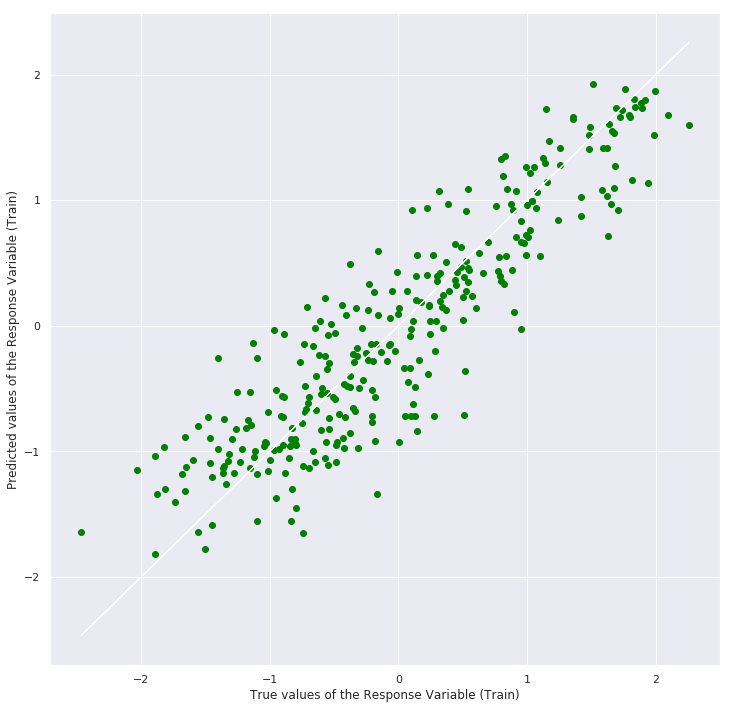

Goodness of Fit of Model 	Test Dataset
Score of model (R^2) 	: 0.8140549738038876
Erroe of prediction (MSE) 	: 0.18224698975788997
Accuracy of prediction 	: 0.8140549738038876



In [76]:
f, axes = plt.subplots(1, 1, figsize=(12, 12))
plt.scatter(y_te, y_test_pred_M, color = "green")
plt.plot(y_te, y_te, 'w-', linewidth = 1)
plt.xlabel("True values of the Response Variable (Train)")
plt.ylabel("Predicted values of the Response Variable (Train)")
plt.show()

print("Goodness of Fit of Model \tTest Dataset")
print("Score of model (R^2) \t:", reg.score(X_te, y_te))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_te, y_test_pred_M))
print("Accuracy of prediction \t:", metrics.r2_score(y_te, y_test_pred_M))    # how well the model actually did on the test set
print()

# Prediction of 2018 Life Ladder

In [77]:
data_2018 = pd.read_excel('WHR2019Chapter2OnlineData.xls',sheet_name = 'Table2.1')

In [78]:
data_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1704 entries, 0 to 1703
Data columns (total 26 columns):
Country name                                                1704 non-null object
Year                                                        1704 non-null int64
Life Ladder                                                 1704 non-null float64
Log GDP per capita                                          1676 non-null float64
Social support                                              1691 non-null float64
Healthy life expectancy at birth                            1676 non-null float64
Freedom to make life choices                                1675 non-null float64
Generosity                                                  1622 non-null float64
Perceptions of corruption                                   1608 non-null float64
Positive affect                                             1685 non-null float64
Negative affect                                             1691 non-null fl

In [79]:
overall = pd.DataFrame(data_2018[['Year','Country name','Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Generosity','Perceptions of corruption','Positive affect','Negative affect','Confidence in national government','Democratic Quality','Delivery Quality','Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year','GINI index (World Bank estimate)','GINI index (World Bank estimate), average 2000-16','gini of household income reported in Gallup, by wp5-year']])

In [80]:
overall.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1704 entries, 0 to 1703
Data columns (total 19 columns):
Year                                                        1704 non-null int64
Country name                                                1704 non-null object
Life Ladder                                                 1704 non-null float64
Log GDP per capita                                          1676 non-null float64
Social support                                              1691 non-null float64
Healthy life expectancy at birth                            1676 non-null float64
Freedom to make life choices                                1675 non-null float64
Generosity                                                  1622 non-null float64
Perceptions of corruption                                   1608 non-null float64
Positive affect                                             1685 non-null float64
Negative affect                                             1691 non-null fl

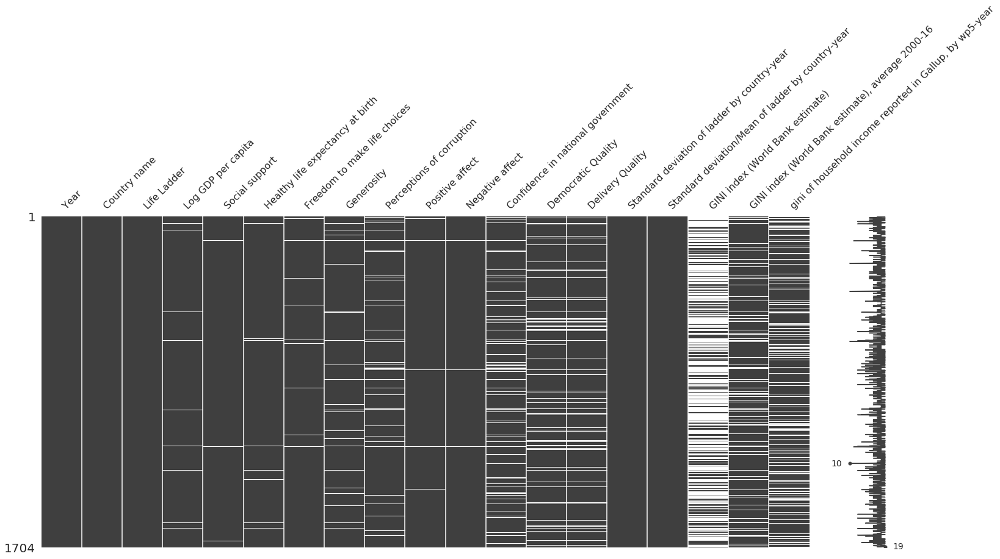

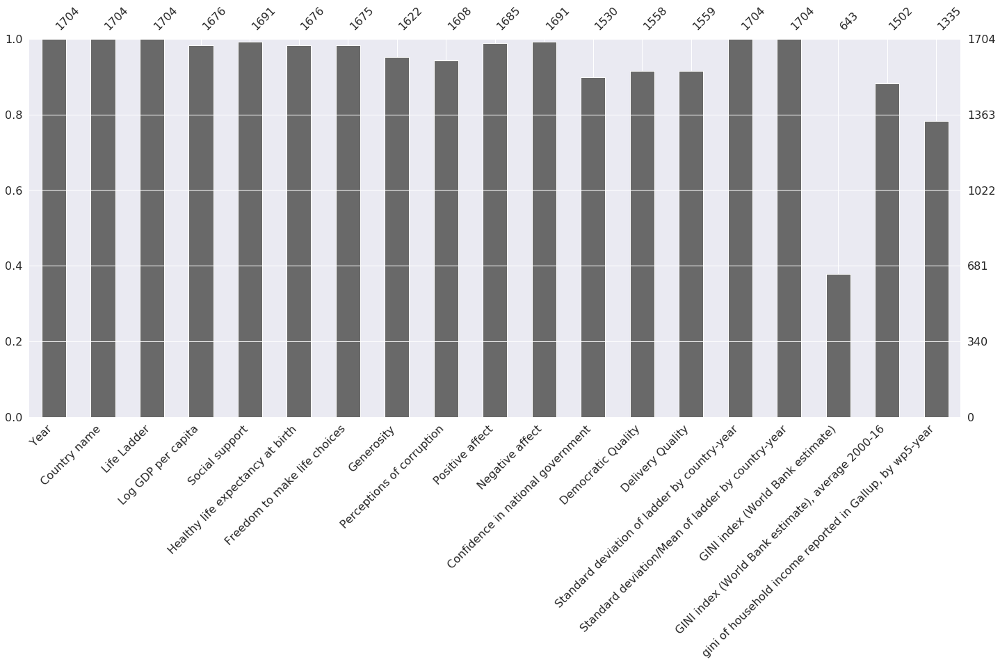

In [81]:
msn.matrix(overall.sample(1704))
msn.bar(overall.sample(1704))

In [82]:
pred_2018 = overall.interpolate(method = 'linear')

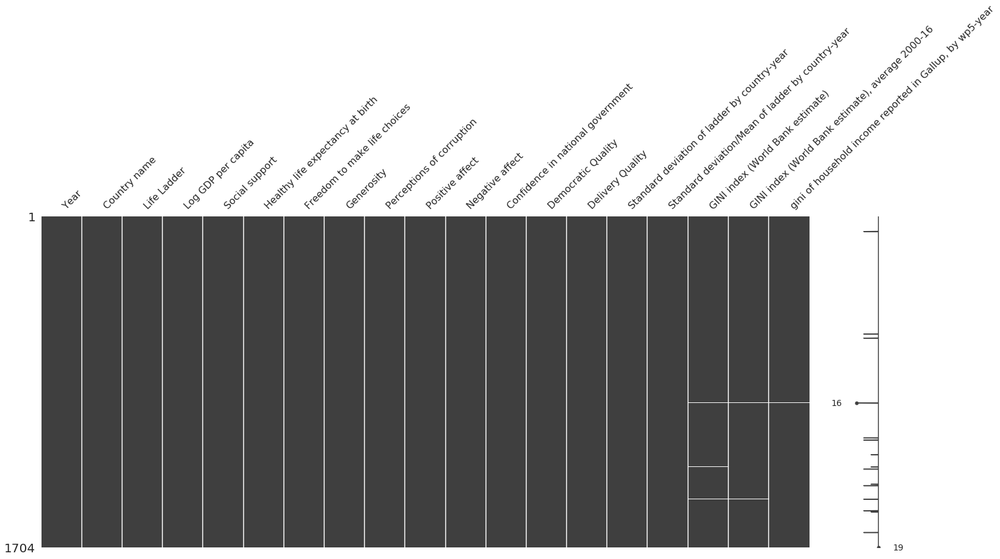

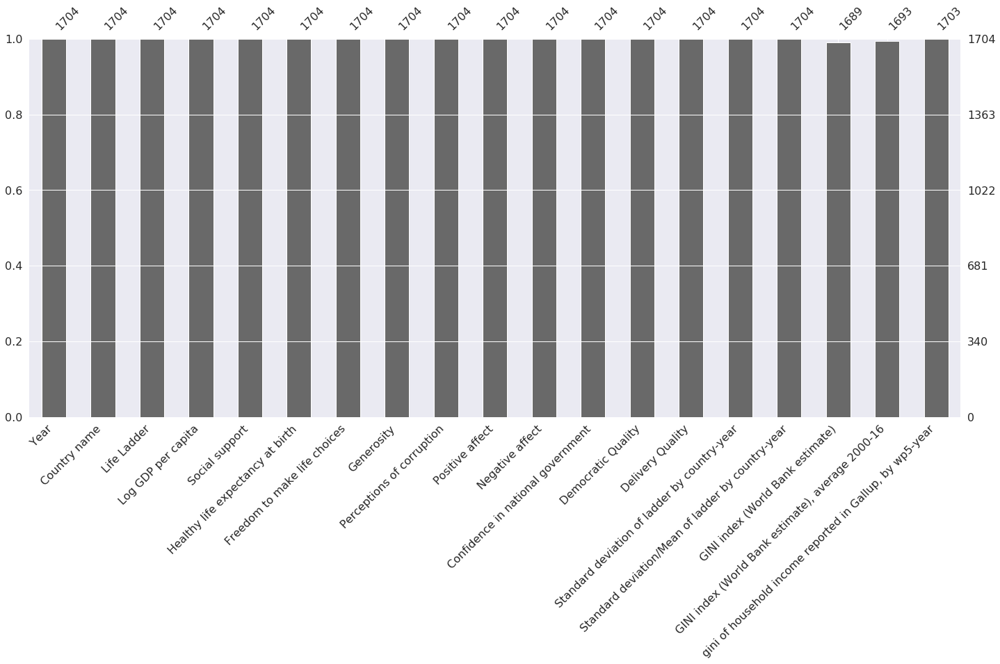

In [83]:
msn.matrix(pred_2018.sample(1704))
msn.bar(pred_2018.sample(1704))

In [84]:
pred_2018 = pred_2018.dropna()
pred_2018 = pred_2018.drop(['GINI index (World Bank estimate)'],axis = 1)
pred_2018 = pred_2018.drop(['Standard deviation of ladder by country-year','Standard deviation/Mean of ladder by country-year'],axis = 1)
pred_2018 = pred_2018.drop(['Country name'],axis = 1)

pred_2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1689 entries, 15 to 1703
Data columns (total 15 columns):
Year                                                        1689 non-null int64
Life Ladder                                                 1689 non-null float64
Log GDP per capita                                          1689 non-null float64
Social support                                              1689 non-null float64
Healthy life expectancy at birth                            1689 non-null float64
Freedom to make life choices                                1689 non-null float64
Generosity                                                  1689 non-null float64
Perceptions of corruption                                   1689 non-null float64
Positive affect                                             1689 non-null float64
Negative affect                                             1689 non-null float64
Confidence in national government                           1689 non-null 

In [85]:
year_2018 = pred_2018[pred_2018["Year"] == 2018]
year_2018 = year_2018.drop(['Year'],axis = 1).reset_index()
year_2018 = year_2018.drop(['index'],axis = 1)
year_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135 entries, 0 to 134
Data columns (total 14 columns):
Life Ladder                                                 135 non-null float64
Log GDP per capita                                          135 non-null float64
Social support                                              135 non-null float64
Healthy life expectancy at birth                            135 non-null float64
Freedom to make life choices                                135 non-null float64
Generosity                                                  135 non-null float64
Perceptions of corruption                                   135 non-null float64
Positive affect                                             135 non-null float64
Negative affect                                             135 non-null float64
Confidence in national government                           135 non-null float64
Democratic Quality                                          135 non-null float64
Deli

In [86]:
year_2018.head(135)

,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,"GINI index (World Bank estimate), average 2000-16","gini of household income reported in Gallup, by wp5-year"
0,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129,0.713300,0.318997,0.435338,-0.420454,-0.435204,0.303250,0.456174
1,5.043086,9.557952,0.798651,65.900002,0.583381,-0.172413,0.758704,0.591043,0.292946,0.257756,-0.837525,-1.016044,0.276000,0.667872
2,5.792797,9.809972,0.899912,68.800003,0.845895,-0.206937,0.855255,0.820310,0.320502,0.261352,-0.075589,-0.227432,0.460938,0.405356
3,5.062449,9.119424,0.814449,66.900002,0.807644,-0.149109,0.676826,0.581488,0.454840,0.670828,0.283572,0.812114,0.319250,0.406403
4,7.176993,10.721021,0.940137,73.599998,0.916028,0.137795,0.404647,0.759019,0.187456,0.468837,1.182196,1.780793,0.342750,0.429814
5,7.396002,10.741893,0.911668,73.000000,0.904112,0.051552,0.523061,0.752350,0.226059,0.488679,0.001410,0.385710,0.302692,0.299504
6,5.167995,9.678014,0.781230,65.500000,0.772449,-0.251795,0.561206,0.592575,0.191392,0.834372,-0.813179,0.003701,0.211000,0.260410
7,4.499217,8.220746,0.705556,64.300003,0.901471,-0.038008,0.701421,0.541345,0.361238,0.831693,-0.868172,-0.967748,0.327750,0.367609
8,5.233770,9.778739,0.904569,66.099998,0.643602,-0.181865,0.718455,0.450333,0.235729,0.421279,0.221913,0.435039,0.281294,0.293444
9,6.892172,10.672445,0.929816,72.000000,0.808387,-0.127278,0.630412,0.749563,0.250297,0.441945,0.632354,0.490869,0.284308,0.299525


In [87]:
y_2018 = pd.DataFrame(year_2018['Life Ladder'])
X_2018 = year_2018.drop(['Life Ladder'],axis = 1)

In [88]:
y_2018_pred_L = linreg.predict(X_2018)
y_2018_pred_R = rfr.predict(X_2018)

In [89]:
scaler.fit(X_2018)    # Data scaling for MLPRegressor
X_M_2018 = pd.DataFrame(scaler.transform(X_2018))

In [90]:
scaler.fit(y_2018)    # Data scaling for MLPRegressor
y_M_2018 = pd.DataFrame(scaler.transform(y_2018))

In [91]:
y_2018_pred_M = reg.predict(X_M_2018)

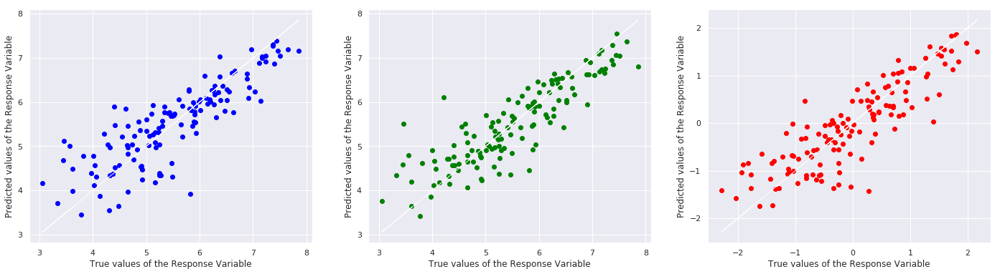

In [92]:
f, axes = plt.subplots(1, 3, figsize=(24, 6))
axes[0].scatter(y_2018, y_2018_pred_L, color = "blue")
axes[0].plot(y_2018, y_2018, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable")
axes[0].set_ylabel("Predicted values of the Response Variable")

axes[1].scatter(y_2018, y_2018_pred_R, color = "green")
axes[1].plot(y_2018, y_2018, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable")
axes[1].set_ylabel("Predicted values of the Response Variable")

axes[2].scatter(y_M_2018, y_2018_pred_M, color = "red")
axes[2].plot(y_M_2018, y_M_2018, 'w-', linewidth = 1)
axes[2].set_xlabel("True values of the Response Variable")
axes[2].set_ylabel("Predicted values of the Response Variable")
plt.show()

In [93]:
print("Goodness of Fit of Linear Regression Model \t")
print("Score of the model (R^2) \t:", linreg.score(X_2018, y_2018))
print("Error of prediction (MSE) \t:", mean_squared_error(y_2018, y_2018_pred_L))
print("Accuracy of prediction:", metrics.r2_score(y_2018, y_2018_pred_L))
print()

print("Goodness of Fit of Random Forest Regressor Model \t")
print("Score of model (R^2) \t:", rfr.score(X_2018, y_2018))
print("Erroe of prediction (MSE) \t:", mean_squared_error(y_2018, y_2018_pred_R))
print("Accuracy of prediction \t:", metrics.r2_score(y_2018, y_2018_pred_R))
print()

print("Goodness of Fit of Linear Regression Model \t")
print("Score of the model (R^2) \t:", reg.score(X_M_2018, y_M_2018))
print("Error of prediction (MSE) \t:", mean_squared_error(y_M_2018, y_2018_pred_M))
print("Accuracy of prediction:", metrics.r2_score(y_M_2018, y_2018_pred_M))
print()

Goodness of Fit of Linear Regression Model 	
Score of the model (R^2) 	: 0.7159718442044444
Error of prediction (MSE) 	: 0.32913033743881753
Accuracy of prediction: 0.7159718442044444

Goodness of Fit of Random Forest Regressor Model 	
Score of model (R^2) 	: 0.7575369790630949
Erroe of prediction (MSE) 	: 0.28096487713999857
Accuracy of prediction 	: 0.7575369790630949

Goodness of Fit of Linear Regression Model 	
Score of the model (R^2) 	: 0.741610883362668
Error of prediction (MSE) 	: 0.2583891166373321
Accuracy of prediction: 0.741610883362668



# conclusion

Based on the scores obtained from cross validation and those from the prediction for the test datasets, MLPRegressor and random forest regressor have the higher scores and accuracies than the linear regression model, and hence would be the better models for Life Ladder predictions in the future.

# Clustering

In [49]:
cluster_data = pd.DataFrame(data_complete[['country','Region indicator','Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Democratic Quality','Delivery Quality','Positive affect','Generosity']])

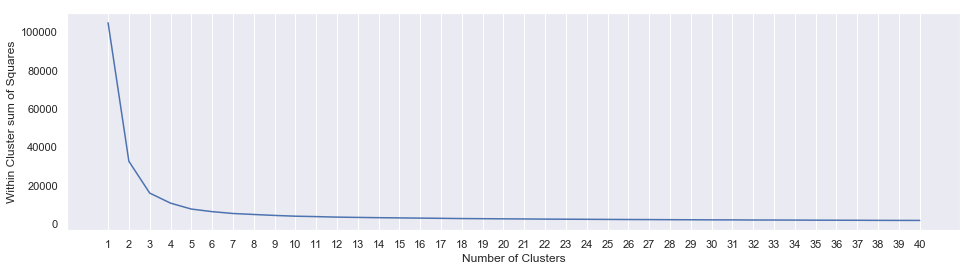

In [50]:
min_clust = 1
max_clust = 40
init_algo = 'k-means++'

from sklearn.cluster import KMeans
# Computer Within Cluster Sum of Squares
within_ss=[]
for num_clust in range(min_clust,max_clust+1):
    kmeans = KMeans(n_clusters = num_clust, init = init_algo,n_init=5)
    kmeans.fit(cluster_data.drop(columns=['country','Region indicator']))
    within_ss.append(kmeans.inertia_)

# Angle Plot: Within SS vs Number of Clusters
f, axes = plt.subplots(1,1,figsize=(16,4))
plt.plot(range(min_clust,max_clust+1),within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1,1.0))
plt.grid(which='major', axis='y')
plt.show()

In [51]:
from sklearn.cluster import KMeans
num_clust = 4
init_algo = "k-means++"

kmeans = KMeans(n_clusters=num_clust, init = init_algo, n_init=20)
kmeans.fit(cluster_data.drop(columns = ['country','Region indicator']))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=20, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

Western Europe                  206
Central and Eastern Europe       54
East Asia                        53
Latin America and Caribbean      52
North America and ANZ            45
Middle East and North Africa     35
Southeast Asia                   11
Name: Region indicator, dtype: int64
Sub-Saharan Africa                    163
South Asia                             28
Southeast Asia                         25
Latin America and Caribbean            17
Middle East and North Africa           10
None                                    9
Western Europe                          2
Commonwealth of Independent States      1
Name: Region indicator, dtype: int64
Latin America and Caribbean           166
Commonwealth of Independent States    138
Middle East and North Africa          136
Central and Eastern Europe            118
Southeast Asia                         57
South Asia                             34
East Asia                              12
Sub-Saharan Africa                      4
No

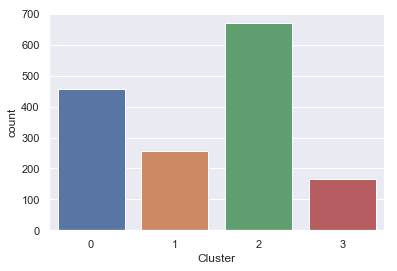

In [52]:
labels = kmeans.predict(cluster_data.drop(columns = ['country','Region indicator']))
cluster_labeled = cluster_data.copy()
cluster_labeled["Cluster"] = pd.Categorical(labels)
sb.countplot(cluster_labeled["Cluster"])
for i in range(6):
    print(cluster_labeled[cluster_labeled["Cluster"]==i]['Region indicator'].value_counts())

E:\anaconda\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


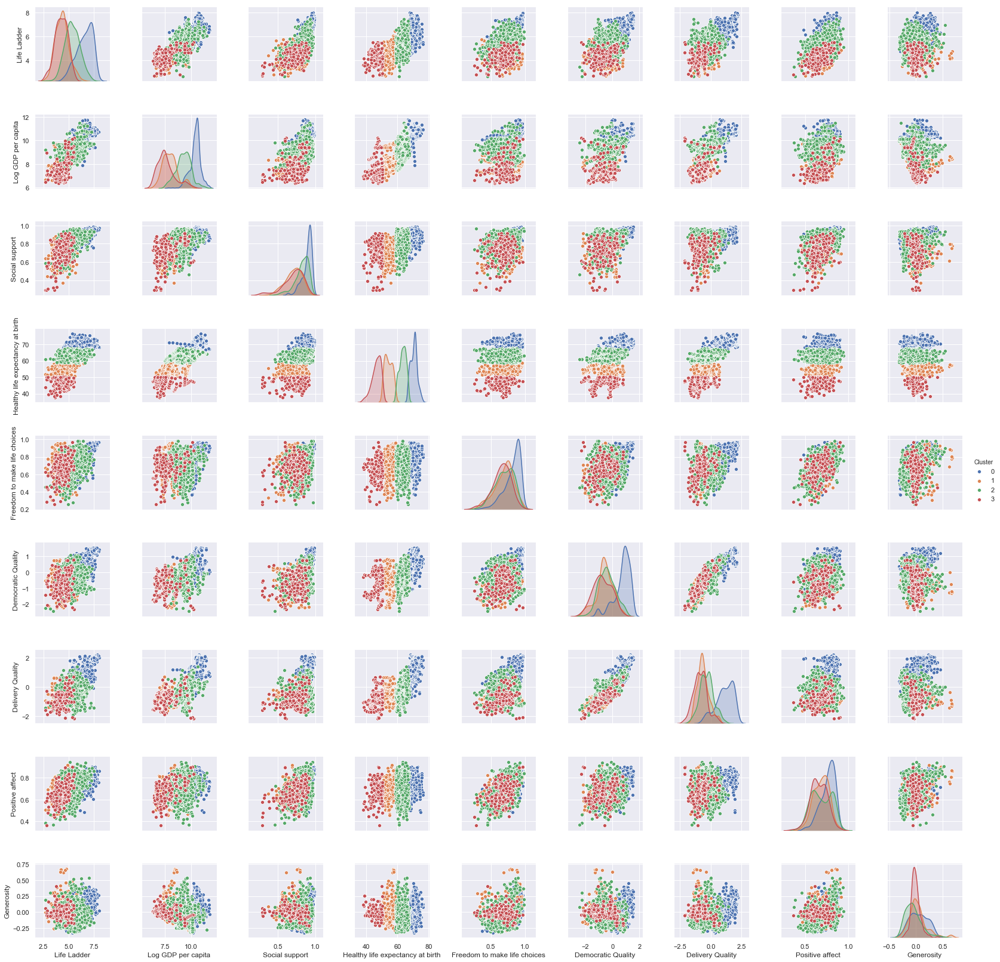

In [53]:
sb.pairplot(cluster_labeled, vars = cluster_data.drop(columns=['country','Region indicator']).columns.values, hue = "Cluster")

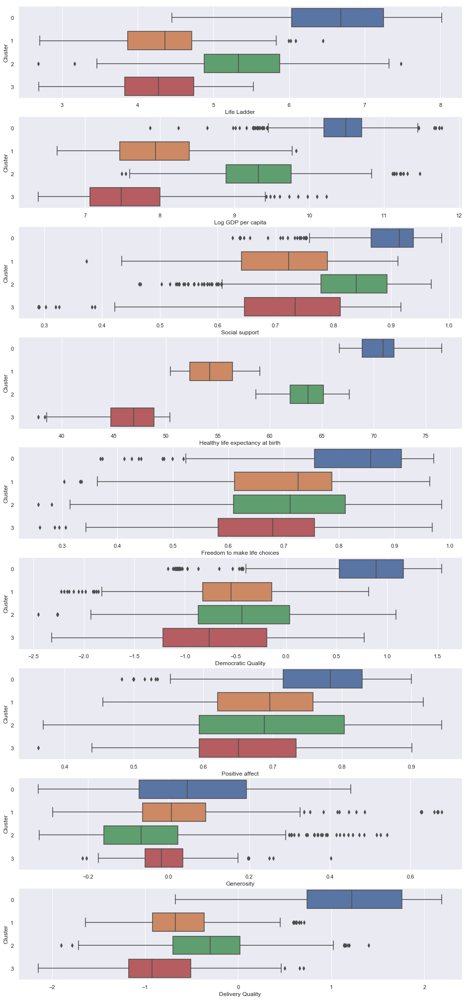

In [54]:
a = ['Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Democratic Quality','Positive affect','Generosity','Delivery Quality']
count = 0
f, axes = plt.subplots(9
                       ,1, figsize=(16,36))
for i in a:
    sb.boxplot(x = i,y='Cluster',data=cluster_labeled,ax =axes[count])
    count+=1

Cluster 1 has the highest Life Ladder, GDP per capita, Social support and healthy life expectancy at birth.
Cluster 2 has the lowest Healthy life expectancy at birth and Log GDP per capita
Cluster 0 and 3 are an intermediate clusters.


# BIRCH

In [33]:
data_cluster = cluster_data.drop(columns=['country','Region indicator'])
from sklearn.cluster import Birch
birch = Birch(n_clusters=4)
birch.fit(data_cluster)


Birch(branching_factor=50, compute_labels=True, copy=True, n_clusters=4,
   threshold=0.5)

In [34]:
birchlabels = birch.predict(data_cluster)
after_clustered4 = cluster_data.copy()
after_clustered4['Cluster'] = pd.Categorical(birchlabels)
after_clustered4

,country,Region indicator,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Democratic Quality,Delivery Quality,Positive affect,Generosity,Cluster
14,Albania,Central and Eastern Europe,5.510124,9.246649,0.784502,68.028885,0.601512,-0.060784,-0.328862,0.606636,-0.174559,1
15,Albania,Central and Eastern Europe,4.550648,9.258439,0.759477,68.291374,0.631830,0.070411,-0.330956,0.633609,-0.132977,1
16,Albania,Central and Eastern Europe,4.813763,9.278097,0.625587,68.512100,0.734648,0.314873,-0.187407,0.684911,-0.030553,1
17,Albania,Central and Eastern Europe,4.606651,9.303031,0.639356,68.691956,0.703851,0.251629,-0.152544,0.688370,-0.086883,1
18,Albania,Central and Eastern Europe,4.511101,9.337774,0.638411,68.871811,0.729819,0.208456,-0.139161,0.675244,-0.023276,1
19,Albania,Central and Eastern Europe,4.639548,9.373718,0.637698,69.051659,0.749611,-0.466199,-0.439627,0.669241,-0.035140,1
20,Algeria,Middle East and North Africa,5.463567,9.462701,0.723966,64.298981,0.592696,-1.140853,-0.740093,0.609722,-0.232023,1
21,Algeria,Middle East and North Africa,5.317194,9.471962,0.810234,64.529564,0.529561,-1.182341,-0.776610,0.550203,-0.207379,1
22,Algeria,Middle East and North Africa,5.604596,9.485086,0.839397,64.739365,0.586663,-1.115535,-0.771172,0.604023,-0.198871,1
23,Algeria,Middle East and North Africa,6.354898,9.509210,0.818189,65.130157,0.536666,-1.002867,-0.783428,0.625905,-0.197471,1


Sub-Saharan Africa              244
Southeast Asia                   24
South Asia                       24
Latin America and Caribbean      16
Middle East and North Africa     10
None                              9
Western Europe                    3
Name: Region indicator, dtype: int64
Latin America and Caribbean           195
Middle East and North Africa          158
Central and Eastern Europe            148
Commonwealth of Independent States    139
Southeast Asia                         58
South Asia                             38
East Asia                              22
Sub-Saharan Africa                      4
None                                    3
Western Europe                          2
Name: Region indicator, dtype: int64
Western Europe                  206
North America and ANZ            45
East Asia                        43
Latin America and Caribbean      25
Central and Eastern Europe       24
Middle East and North Africa     13
Southeast Asia                   11
Na

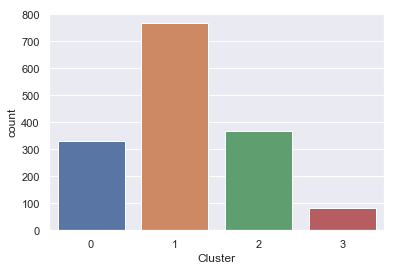

In [35]:
sb.countplot(after_clustered4["Cluster"])
for i in range(10):
    print(after_clustered4[after_clustered4["Cluster"]==i]['Region indicator'].value_counts())

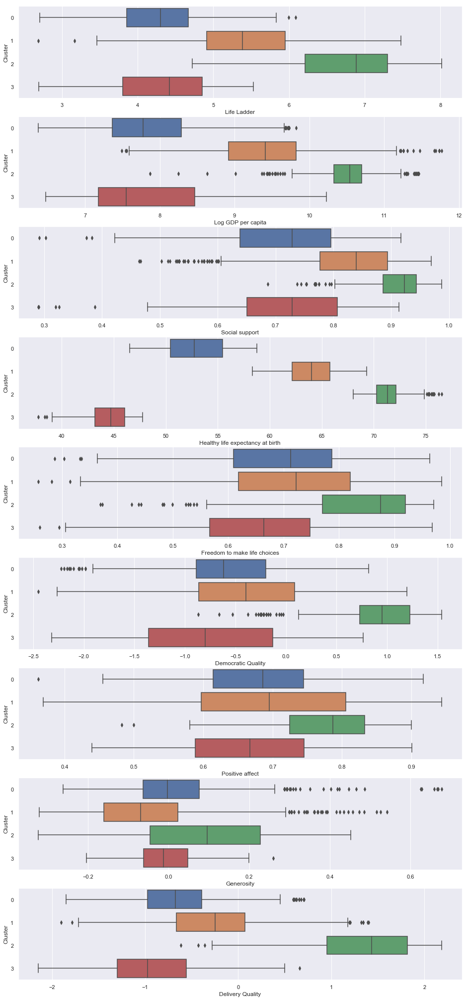

In [36]:
a = ['Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Democratic Quality','Positive affect','Generosity','Delivery Quality']
count = 0
f, axes = plt.subplots(9
                       ,1, figsize=(16,36))
for i in a:
    sb.boxplot(x = i,y='Cluster',data=after_clustered4,ax =axes[count])
    count+=1

array([1, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 1,
       2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 0, 0, 3,
       0, 0, 3, 0, 0, 3, 3, 3, 0, 0, 0, 0, 3, 0, 0, 3, 0, 3, 0, 3, 0, 3,
       0, 3, 0, 3, 3, 0, 3, 3, 3, 3, 3, 3, 0, 0, 3, 0, 3, 0, 0, 3, 3, 3,
       0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,